# Postprocessing of Volve 3D velocity model

**Author: M.Ravasi**

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import sys
import numpy as np
import segyio
import pylops
import matplotlib.pyplot as plt

from scipy.interpolate import RegularGridInterpolator
from segyshot import SegyShot
from visual import explode_volume

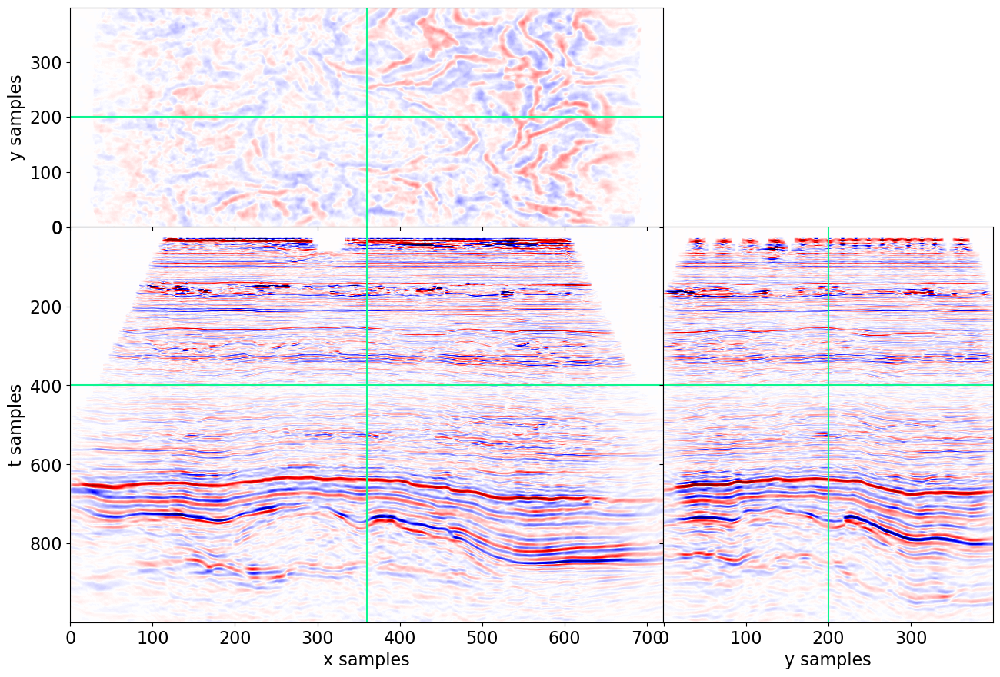

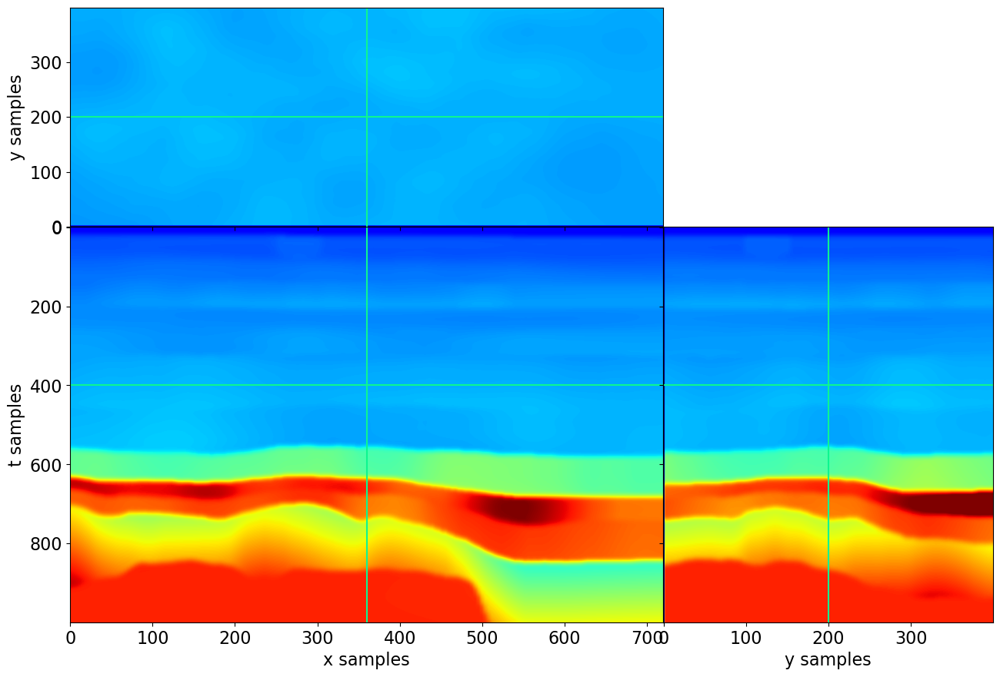

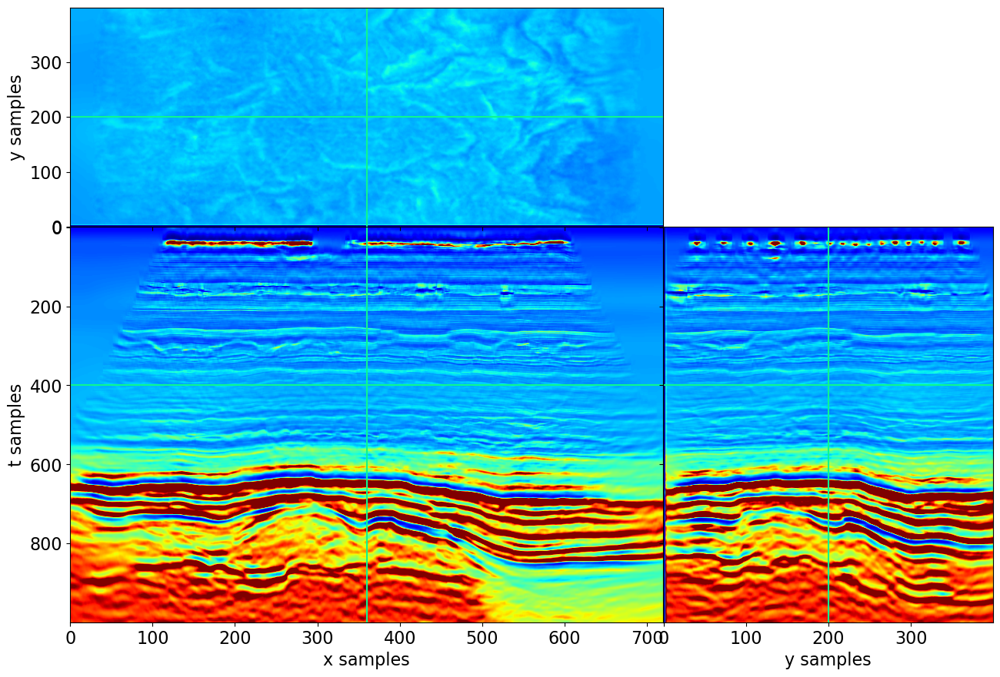

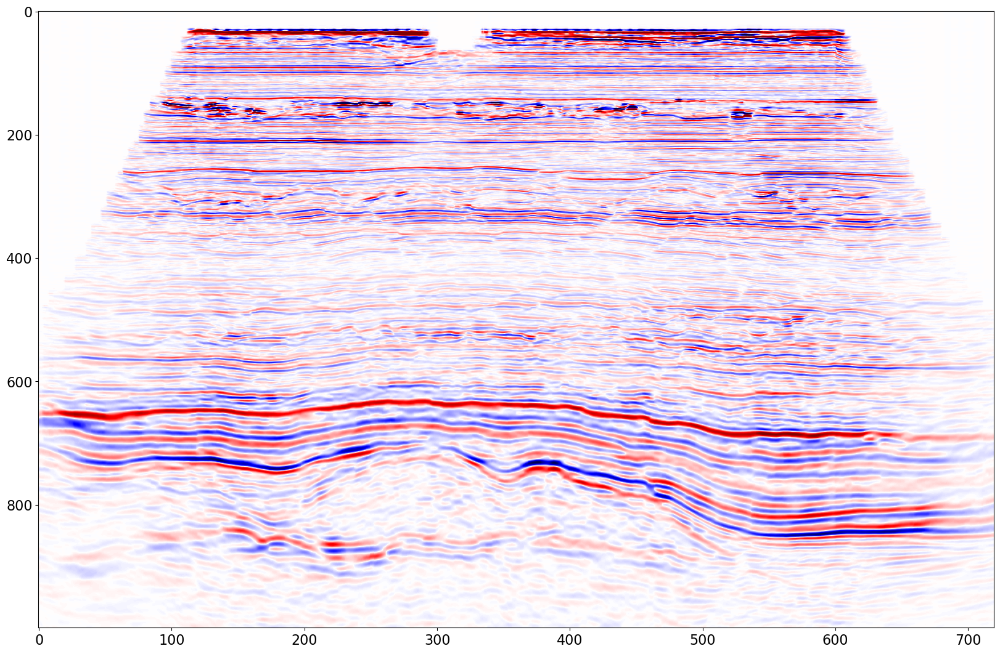

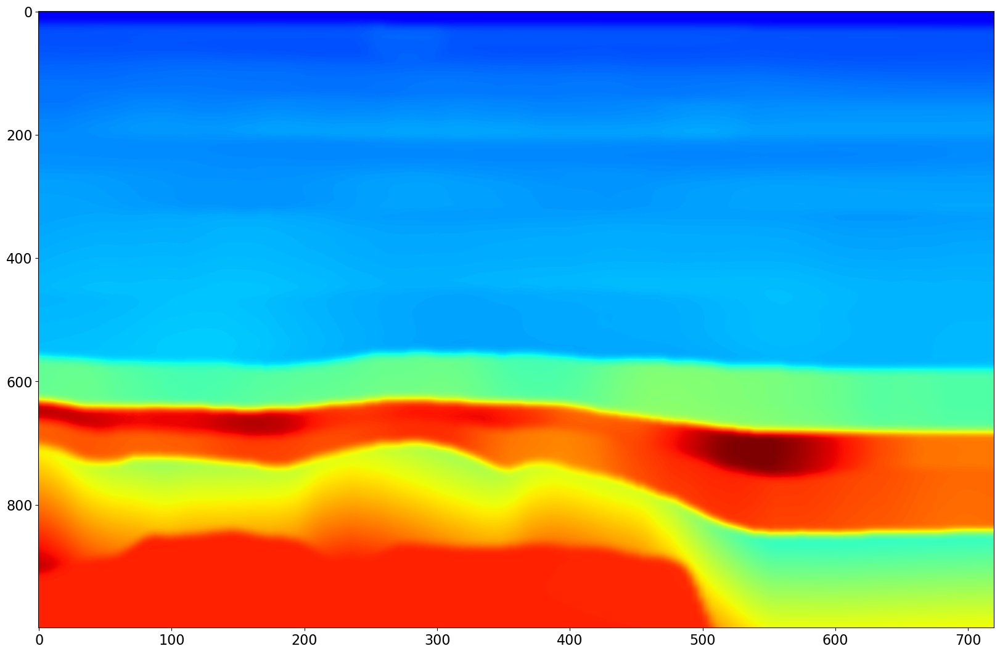

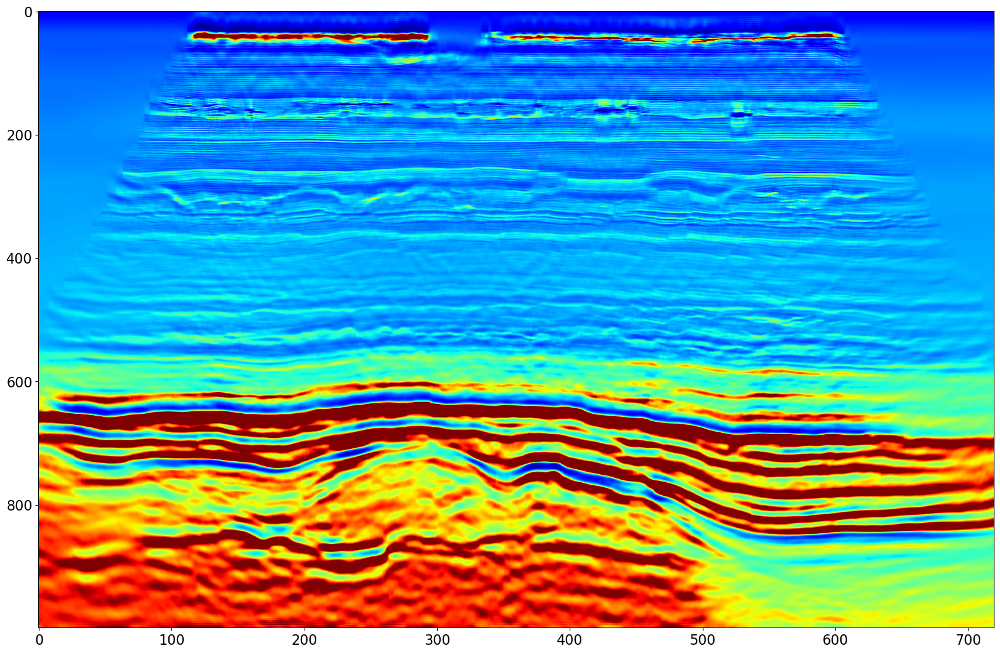

In [2]:
# Load data, background and inverted velocities
f = np.load('Figs/Volve3Dinv.npz')
d = f['d']
vp0 = f['vp0']
vpinv = f['vpinv']
ny, nx, nz = vpinv.shape

explode_volume(d.transpose(2, 1, 0), t= 400,
               cmap='seismic', clipval=(-10, 10),
               figsize=(15, 10));

explode_volume(vp0.transpose(2, 1, 0), t= 400,
               cmap='jet', clipval=(1000, 5000),
               figsize=(15, 10));

explode_volume(vpinv.transpose(2, 1, 0), t= 400,
               cmap='jet', clipval=(1000, 5000),
               figsize=(15, 10));

plt.figure(figsize=(20, 13))
plt.imshow(d[ny//2].T, cmap='seismic', vmin=-10, vmax=10)
plt.axis('tight')

plt.figure(figsize=(20, 13))
plt.imshow(vp0[ny//2].T, cmap='jet', vmin=1000, vmax=5000)
plt.axis('tight')

plt.figure(figsize=(20, 13))
plt.imshow(vpinv[ny//2].T, cmap='jet', vmin=1000, vmax=5000)
plt.axis('tight');

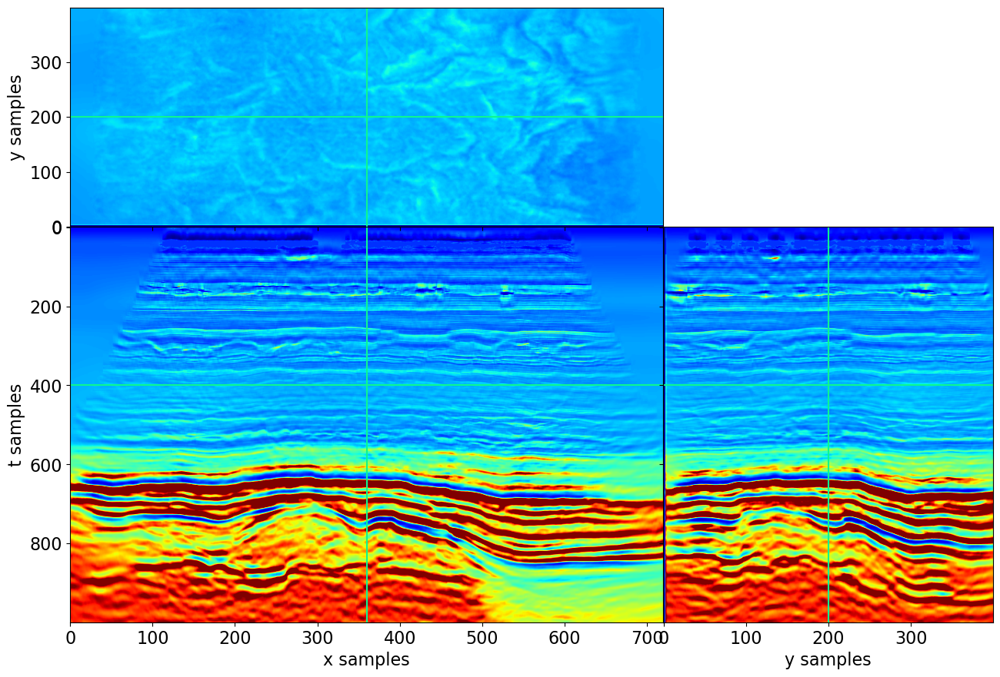

In [3]:
# Remove unreasonably high contrasts
vpinv[vpinv>5300] = 5300

# Remove artefacts near seabed
vpinv[..., :70][vpinv[..., :70]>2000] = 1700

explode_volume(vpinv.transpose(2, 1, 0), t= 400,
               cmap='jet', clipval=(1000, 5000),
               figsize=(15, 10));

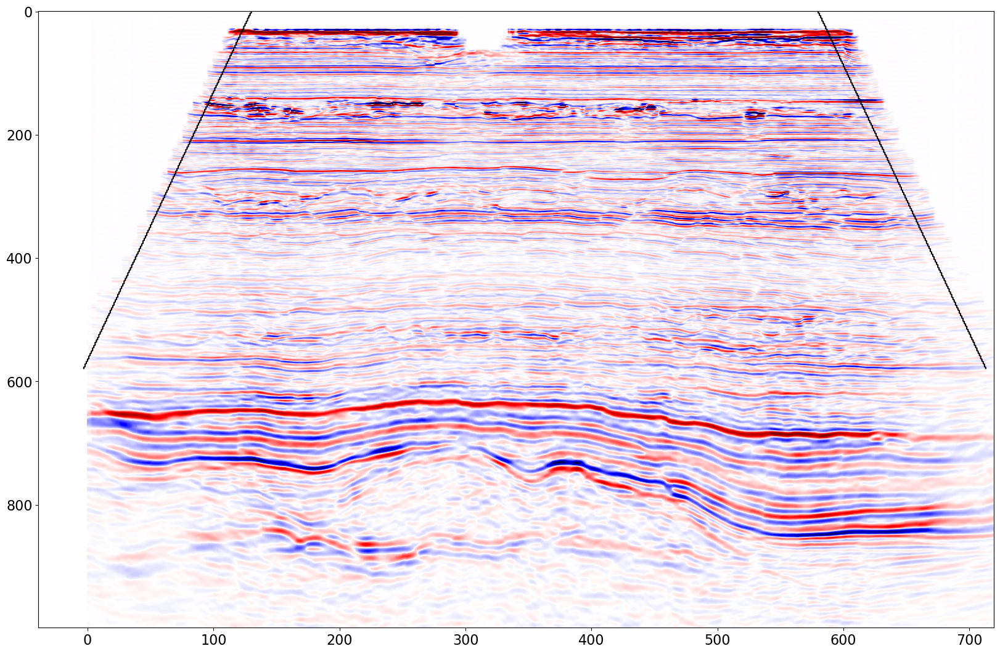

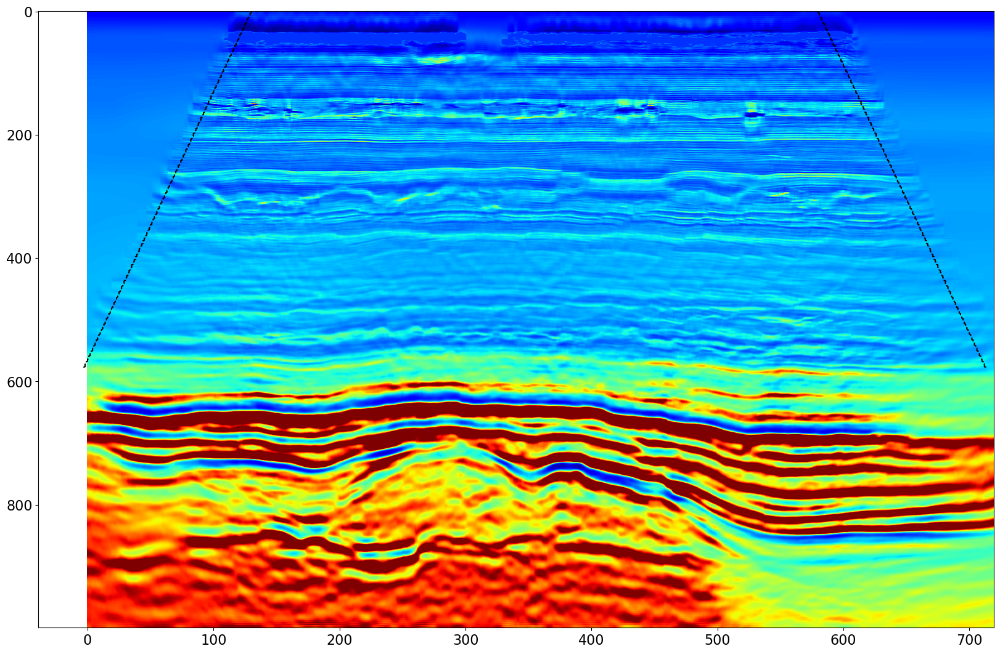

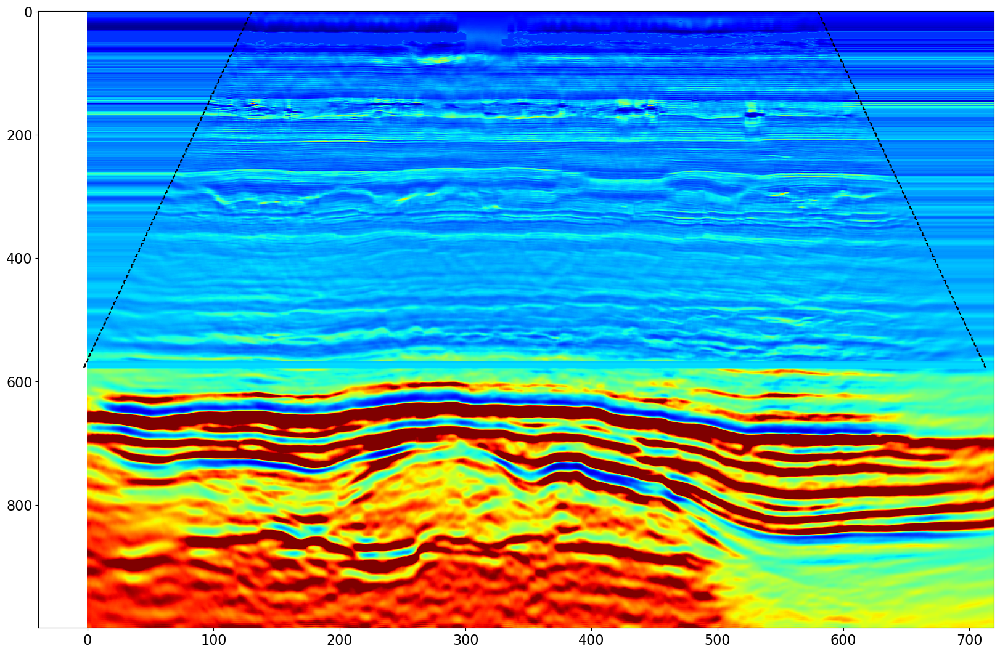

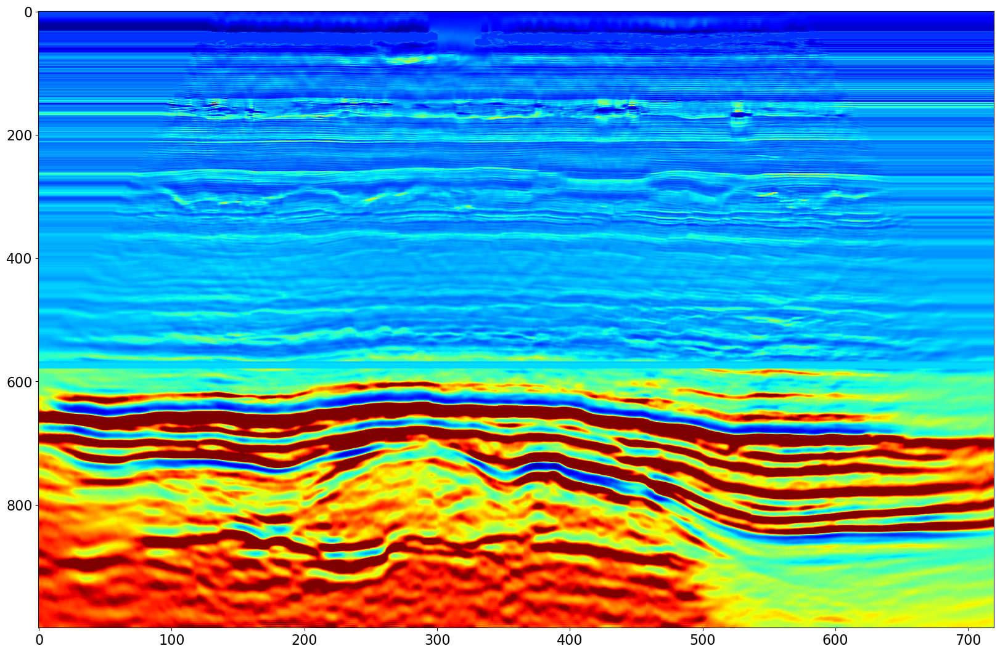

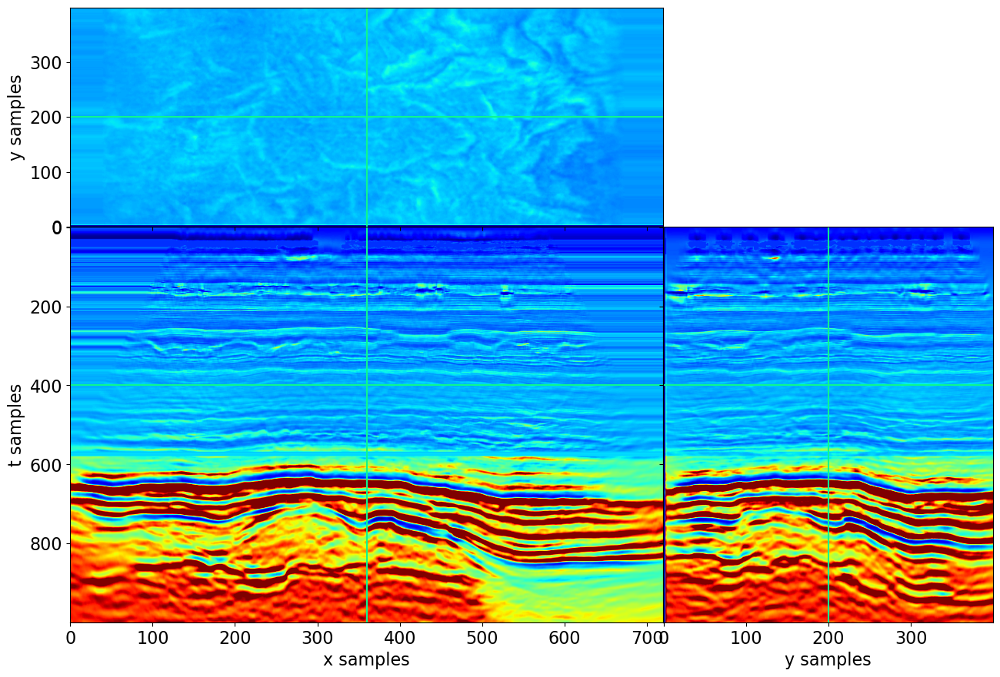

In [4]:
# Extend velocity model in area without illumination
vpinv_filled = vpinv.copy()

ixmax = 130 # maximum index of x axis after which there is no gap in the data
ixmin = 580 # minumum index of x axis before which there is no gap in the data
izmax = 580 # maximum index of z axis after which there is no gap in the data

mask_left = ixmax - 0.23 * np.arange(izmax)
imask_left = np.round(mask_left).astype(np.int64)
mask_right = ixmin + 0.23 * np.arange(izmax)
imask_right = np.round(mask_right).astype(np.int64)

plt.figure(figsize=(20, 13))
plt.imshow(d[ny//2].T, cmap='seismic', vmin=-10, vmax=10)
plt.plot(imask_left, np.arange(izmax), 'k')
plt.plot(imask_right, np.arange(izmax), 'k')
plt.axis('tight');

for iy in range(ny):
    for iz in range(izmax):
        vpinv_filled[iy, :imask_left[iz], iz] = vpinv_filled[iy, imask_left[iz], iz]
        vpinv_filled[iy, imask_right[iz]:, iz] = vpinv_filled[iy, imask_right[iz], iz]

plt.figure(figsize=(20, 13))
plt.imshow(vpinv[ny//2].T, cmap='jet', vmin=1000, vmax=5000)
plt.plot(imask_left, np.arange(izmax), '--k')
plt.plot(imask_right, np.arange(izmax), '--k')
plt.axis('tight');

plt.figure(figsize=(20, 13))
plt.imshow(vpinv_filled[ny//2].T, cmap='jet', vmin=1000, vmax=5000)
plt.plot(imask_left, np.arange(izmax), '--k')
plt.plot(imask_right, np.arange(izmax), '--k')
plt.axis('tight');

plt.figure(figsize=(20, 13))
plt.imshow(vpinv_filled[ny//2].T, cmap='jet', vmin=1000, vmax=5000)
plt.axis('tight');

explode_volume(vpinv_filled.transpose(2, 1, 0), t= 400, y=ny//2,
               cmap='jet', clipval=(1000, 5000),
               figsize=(15, 10));

In [5]:
# Identify spatial sampling of velocity model
segyfilev = '../../data/seismicinversion/ST10010ZC11-MIG-VEL.MIG_VEL.VELOCITY.3D.JS-017527.segy'
fv = segyio.open(segyfilev)
ilvel, xlvel, zvel = fv.ilines, fv.xlines, fv.samples

ilvelgrid = fv.attributes(segyio.TraceField.INLINE_3D)[:]
xlvelgrid = fv.attributes(segyio.TraceField.CROSSLINE_3D)[:]

ilvel, xlvel = np.unique(ilvelgrid), np.unique(xlvelgrid)
dilvel, dxlvel = ilvel[1] - ilvel[0], xlvel[1] - xlvel[0]

# Load acquisition geometry and rotate velocity model
sg = SegyShot('../../../../../Data/Volve/ST10010_1150780_40203.sgy', components=['P', 'VZ', 'VX', 'VY'])
sg.interpret()
_,_,_,_, (xvel_local, yvel_local) = sg.rotategeometry(velfile=segyfilev, plotflag=0)

dxvel = np.round(np.mean(np.diff(xvel_local[:len(xlvel)])))
dyvel = np.round(np.mean(np.diff(-yvel_local[::len(xlvel)])))

print(f'Inline and Crossline sampling (velocity model) {dilvel}-{dxlvel}')
print(f'Y and X sampling (velocity model) {dyvel}-{dxvel}')

Local regular axis:
 ox=0.000000, dx=49.793406 nx=241
 oy=-0.000000, dy=49.540976 ny=109
Inline and Crossline sampling (velocity model) 4-4
Y and X sampling (velocity model) 50.0-50.0


In [6]:
# Identify spatial sampling of image/inverted model
segyfile = '../../data/seismicinversion/ST10010ZC11_PZ_PSDM_KIRCH_FULL_D.MIG_FIN.POST_STACK.3D.JS-017536.segy'
fi = segyio.open(segyfile, ignore_geometry=True)
ilgrid = fi.attributes(segyio.TraceField.INLINE_3D)[:]
xlgrid = fi.attributes(segyio.TraceField.CROSSLINE_3D)[:]
z = fi.samples[:nz]

il, xl = np.unique(ilgrid), np.unique(xlgrid)
dil, dxl = il[1] - il[0], xl[1] - xl[0]

dy, dx, dz = dyvel * (dil / dilvel), dxvel * (dxl / dxlvel), z[2]-z[1]
y, x = np.arange(ny) * dy, np.arange(nx) * dx

print(f'Inline and Crossline sampling (image) {dil}-{dxl}')
print(f'Y and X sampling (image) {dy}-{dx}')

Inline and Crossline sampling (image) 1-1
Y and X sampling (image) 12.5-12.5


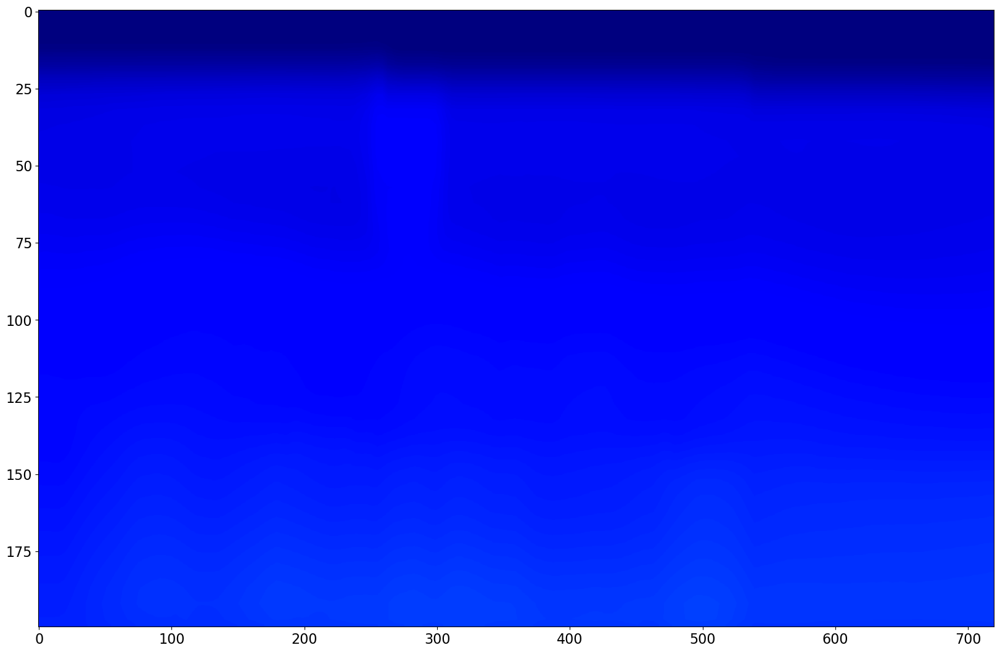

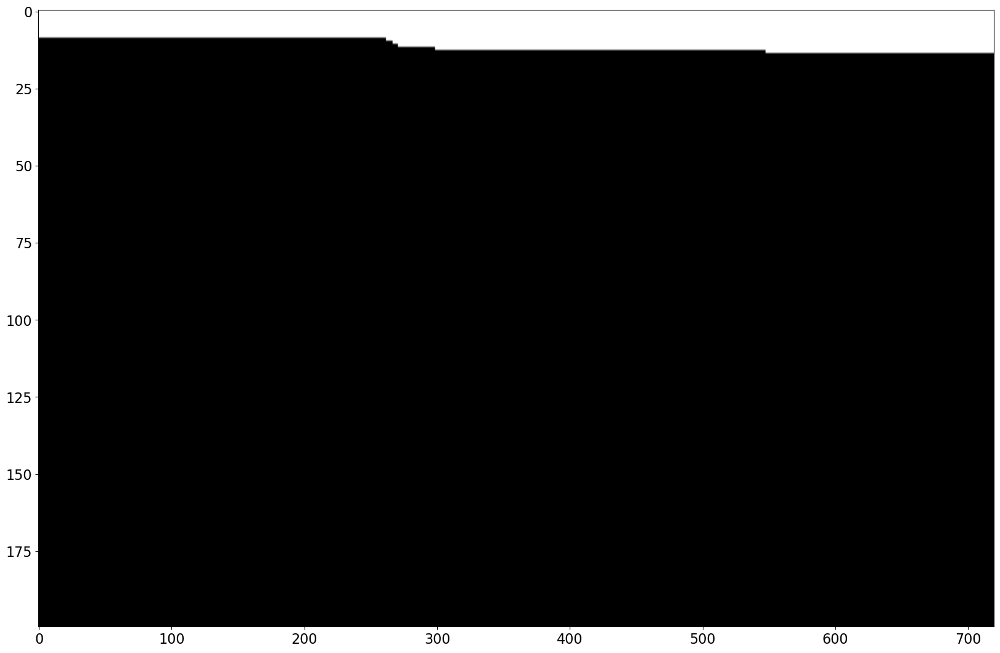

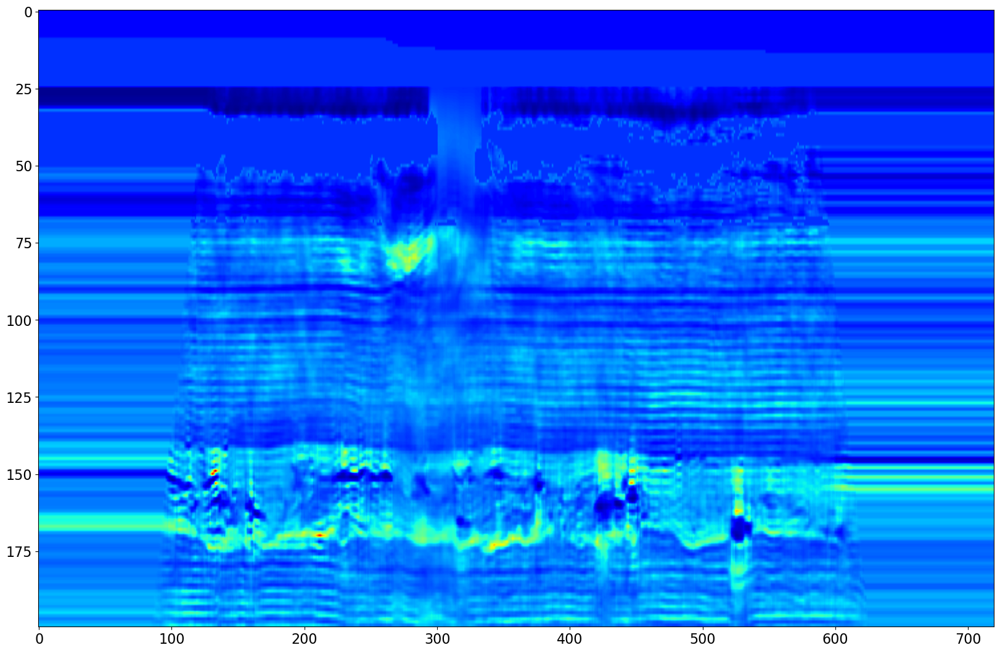

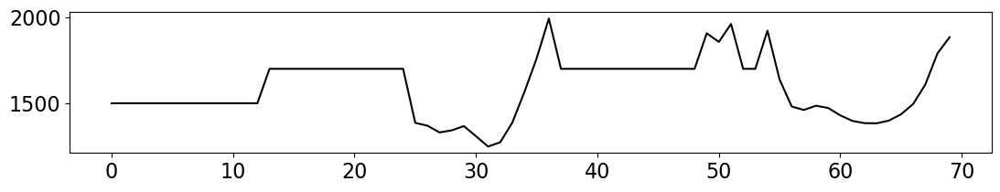

In [7]:
# Extract mask of sea from background and apply to inverted model
vp_seamask = np.zeros_like(vp0)
vp_seamask[vp0<=1500] = 1
vpinv_filled = vpinv_filled
vpinv_filled[vp_seamask==1] = 1500
vpinv_filled[..., :25][vp_seamask[..., :25]==0] = 1700

#explode_volume(vp_seamask[..., :200].transpose(2, 1, 0), clipval=(0, 1),
#               cmap='gray', figsize=(15, 10))

plt.figure(figsize=(20, 13))
plt.imshow(vp0[ny//2, :, :200].T, cmap='jet', vmin=1500, vmax=5000)
plt.axis('tight')

plt.figure(figsize=(20, 13))
plt.imshow(vp_seamask[ny//2, :, :200].T, cmap='gray')
plt.axis('tight')

plt.figure(figsize=(20, 13))
plt.imshow(vpinv_filled[ny//2, :, :200].T, cmap='jet', vmin=1000, vmax=5000)
plt.axis('tight')

plt.figure(figsize=(13, 2))
plt.plot(vpinv_filled[ny//2, nx//2, :70], 'k');

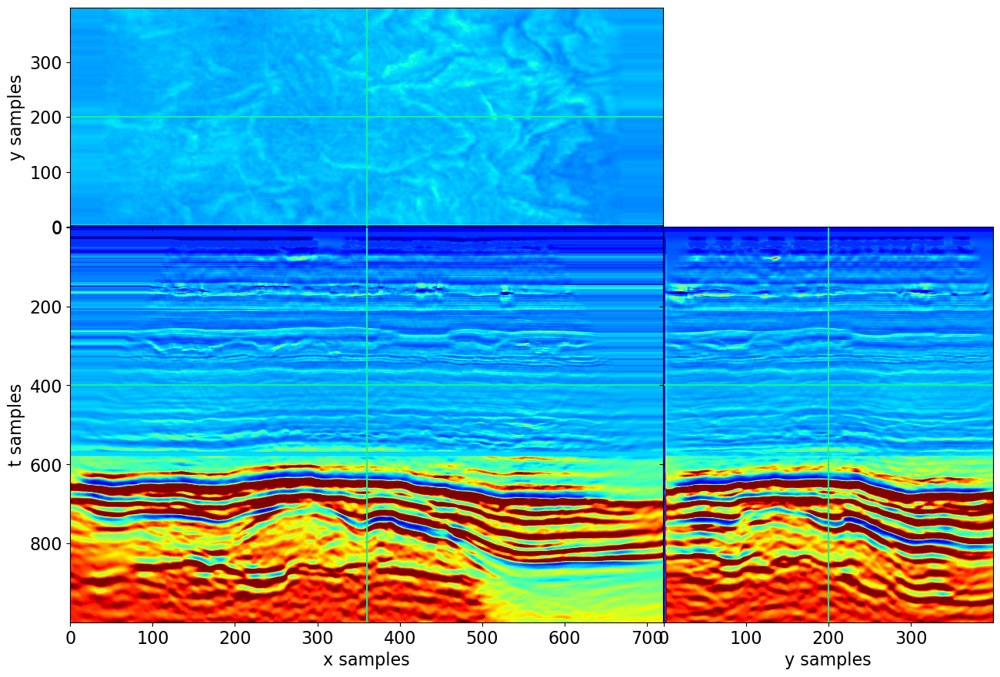

In [8]:
# Final model
explode_volume(vpinv_filled.transpose(2, 1, 0), t= 400,
               cmap='jet', clipval=(1000, 5000),
               figsize=(15, 10));

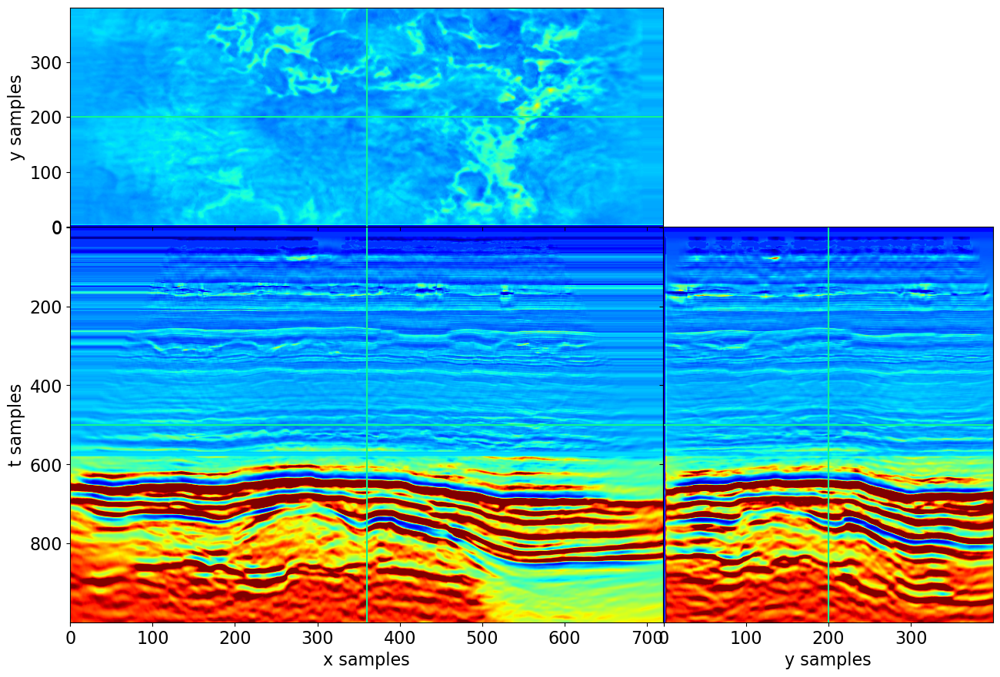

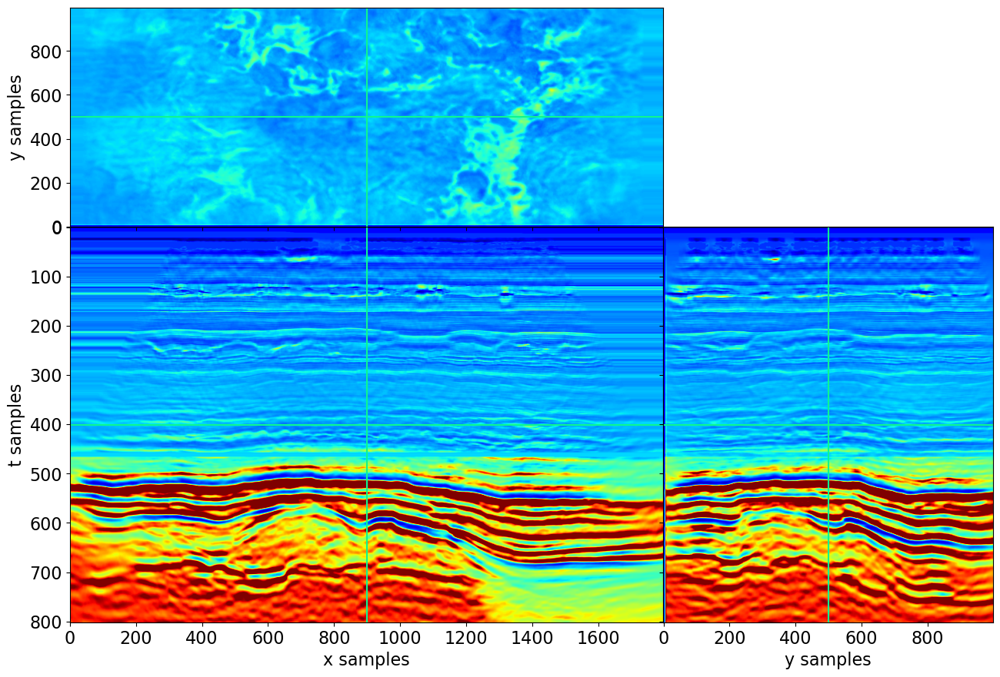

In [12]:
# Interpolate inverted model over a finer grid and extract mask of sea
dyint, dxint, dzint = 5, 5, 5
yint = np.arange(y[0], y[-1], dyint)
xint = np.arange(x[0], x[-1], dxint)
zint = np.arange(0, z[-1], dzint)

nyint, nxint, nzint = len(yint), len(xint), len(zint)
Y, X, Z = np.meshgrid(yint, xint, zint, indexing='ij')
YXZ = np.vstack((Y.ravel(), X.ravel(), Z.ravel())).T

interpolator = RegularGridInterpolator((y, x, z), vpinv_filled, 
                                       bounds_error=False, fill_value=0)

nyxz = 1_000_000
vpinv_int = np.hstack([interpolator(YXZ[iyxz:min(iyxz + nyxz, YXZ.shape[0])]).astype(np.float32) 
                       for iyxz in range(0, YXZ.shape[0], nyxz)])
vpinv_int = vpinv_int.reshape(nyint, nxint, nzint)

explode_volume(vpinv_filled.transpose(2, 1, 0),
               cmap='jet', clipval=(1000, 5000),
               figsize=(15, 10))

explode_volume(vpinv_int.transpose(2, 1, 0),
               cmap='jet', clipval=(1000, 5000),
               figsize=(15, 10));

In [11]:
# Save model
np.savez(os.path.join('Figs/', 'Volve3Dpostproc'), vpinv=vpinv_int, y=yint, x=xint, z=zint)